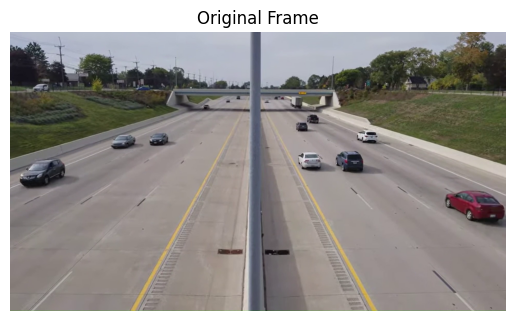

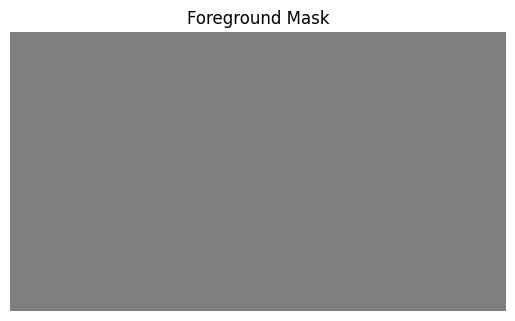

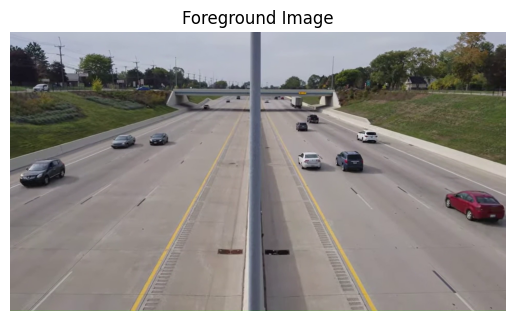

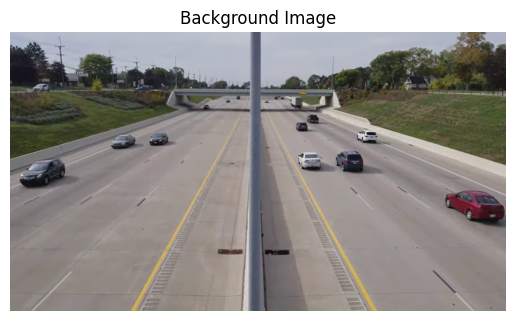

Processed frame 0
Processed frame 1
Processed frame 2
Processed frame 3
Processed frame 4
Processed frame 5
Processed frame 6
Processed frame 7
Processed frame 8
Processed frame 9


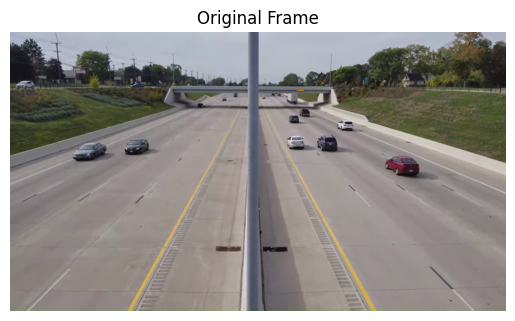

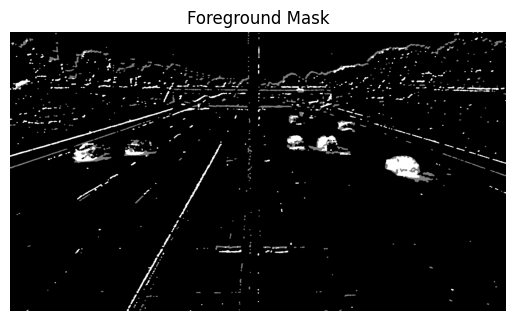

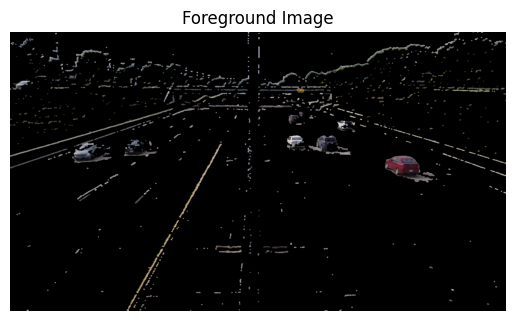

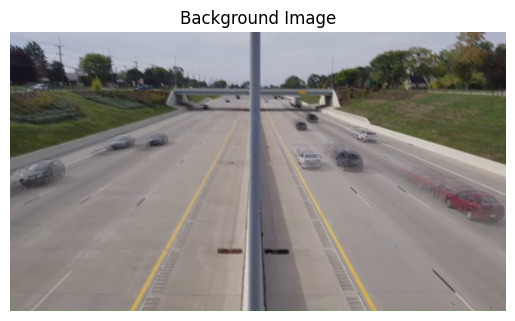

Processed frame 10
Processed frame 11
Processed frame 12
Processed frame 13
Processed frame 14
Processed frame 15
Processed frame 16
Processed frame 17
Processed frame 18
Processed frame 19


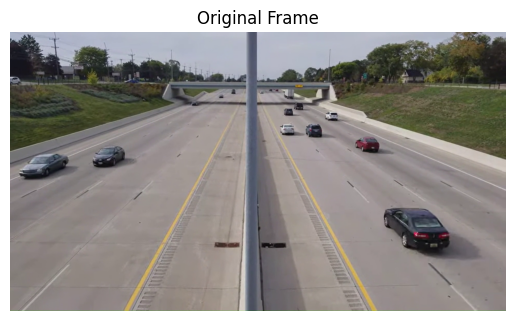

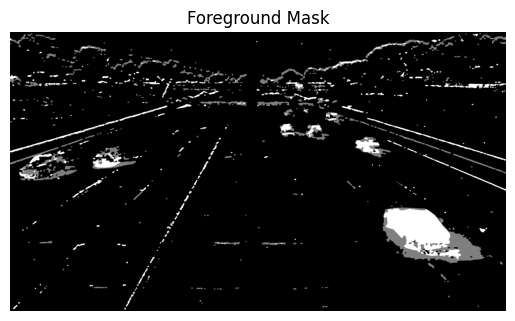

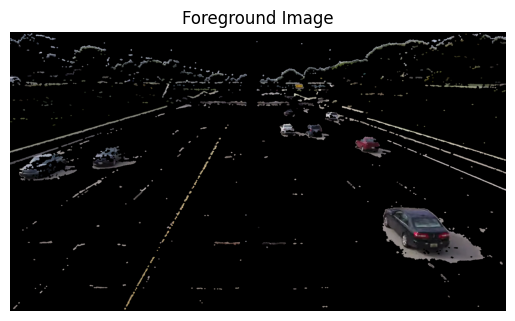

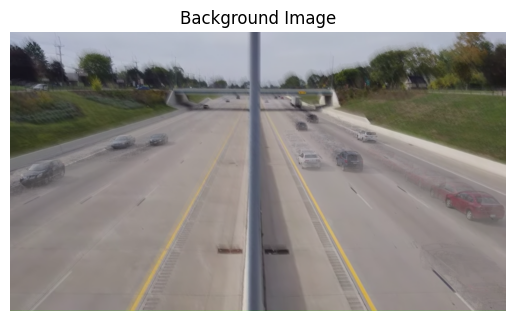

Processed frame 20
Processed frame 21
Processed frame 22
Processed frame 23
Processed frame 24
Processed frame 25
Processed frame 26
Processed frame 27
Processed frame 28
Processed frame 29


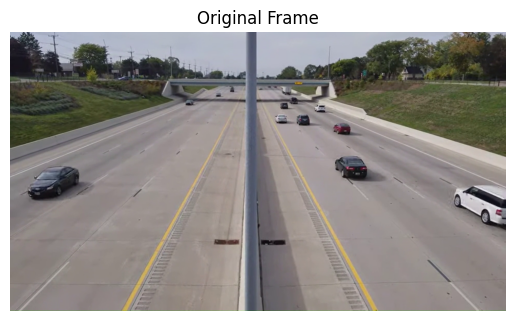

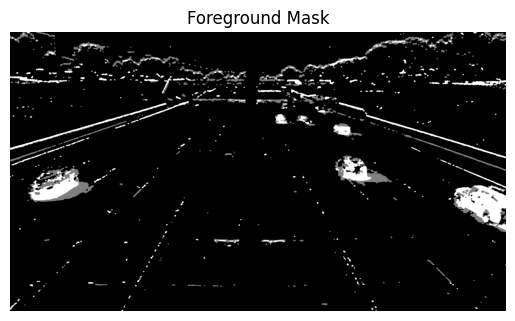

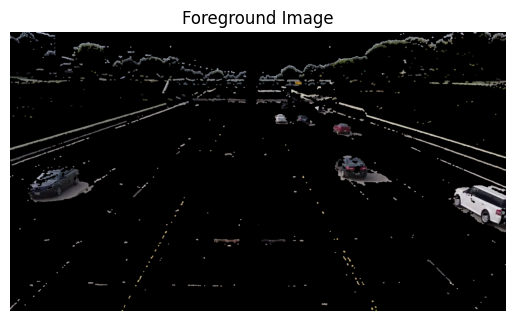

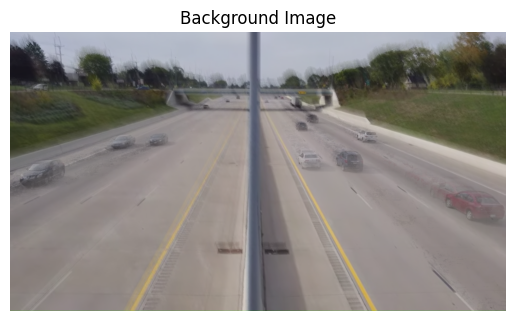

Processed frame 30
Processed frame 31
Processed frame 32
Processed frame 33
Processed frame 34
Processed frame 35
Processed frame 36
Processed frame 37
Processed frame 38
Processed frame 39


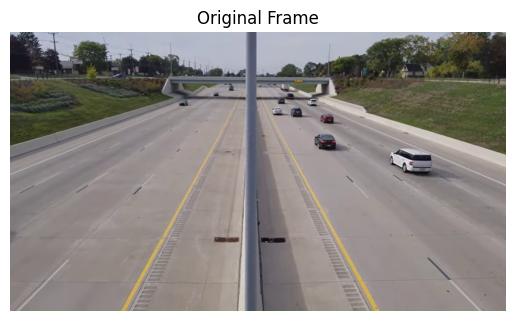

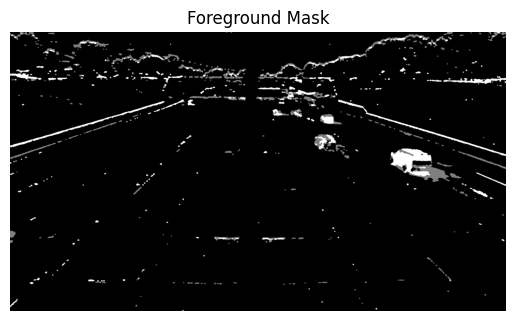

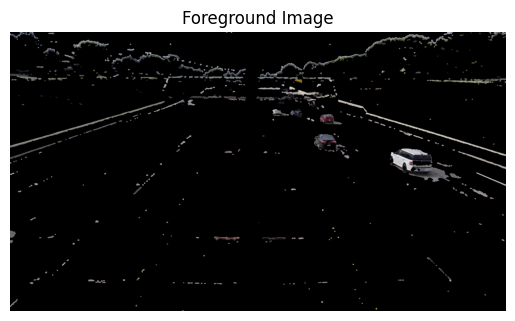

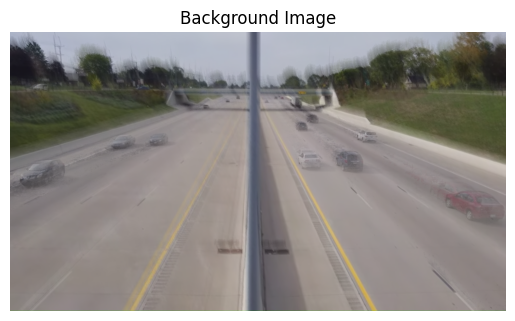

Processed frame 40
Processed frame 41
Processed frame 42
Processed frame 43
Processed frame 44
Processed frame 45
Processed frame 46
Processed frame 47
Processed frame 48
Processed frame 49


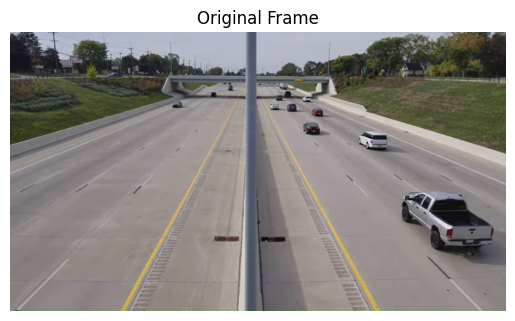

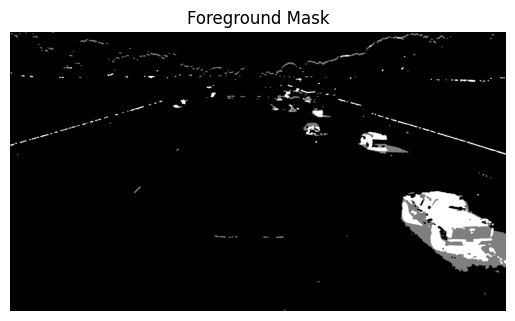

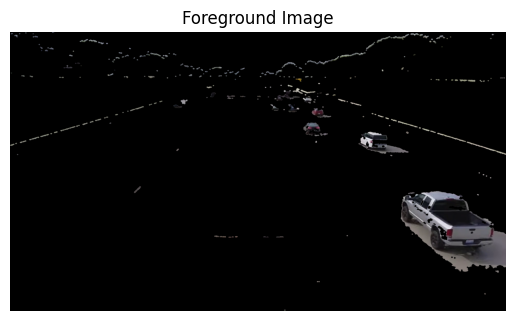

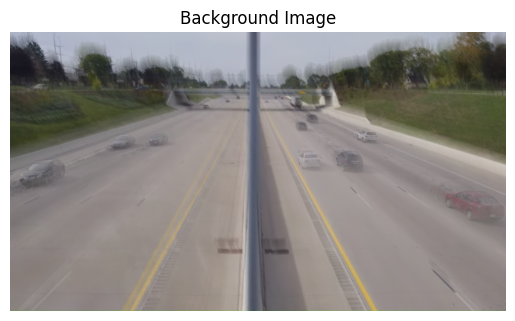

Processed frame 50
Processed frame 51
Processed frame 52
Processed frame 53
Processed frame 54
Processed frame 55
Processed frame 56
Processed frame 57
Processed frame 58
Processed frame 59


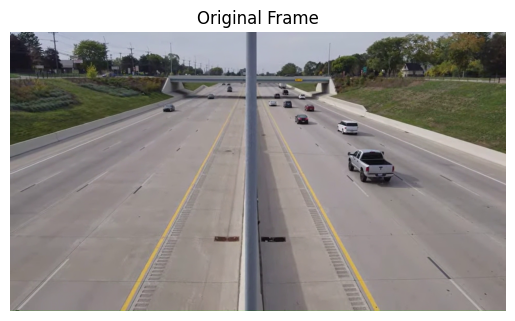

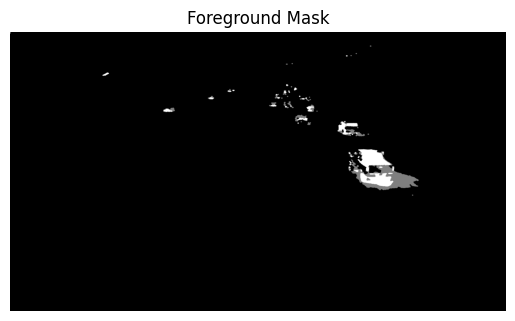

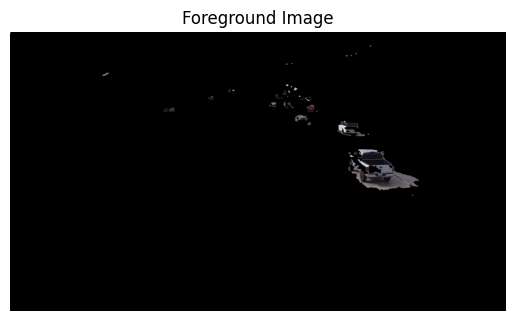

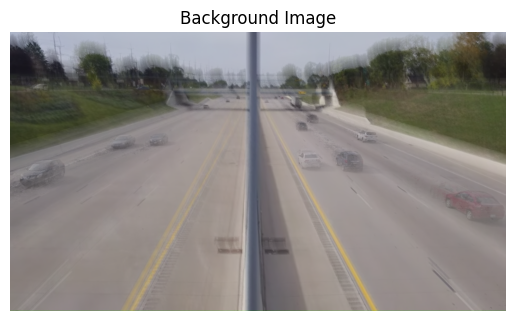

Processed frame 60
Processed frame 61
Processed frame 62
Processed frame 63
Processed frame 64
Processed frame 65
Processed frame 66
Processed frame 67
Processed frame 68
Processed frame 69


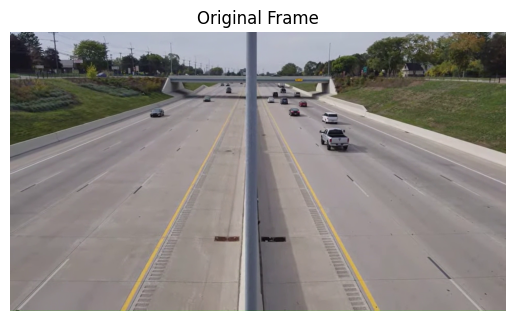

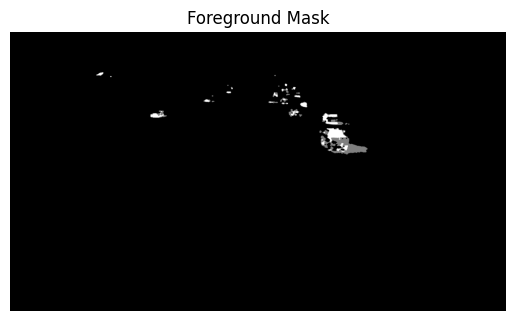

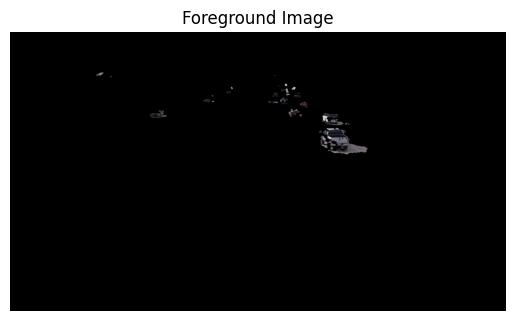

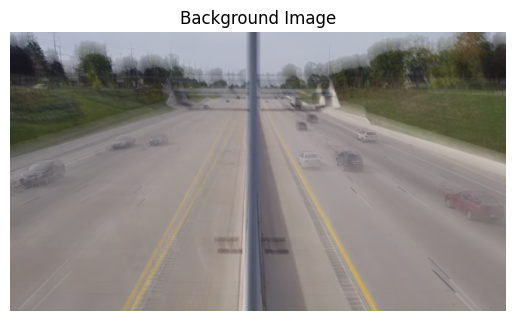

Processed frame 70
Processed frame 71
Processed frame 72
Processed frame 73
Processed frame 74
Processed frame 75
Processed frame 76
Processed frame 77
Processed frame 78
Processed frame 79


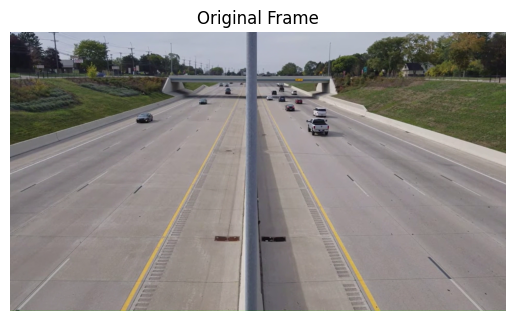

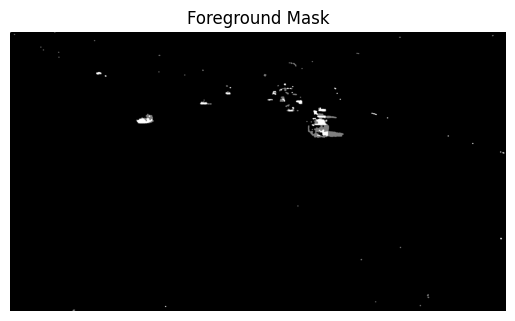

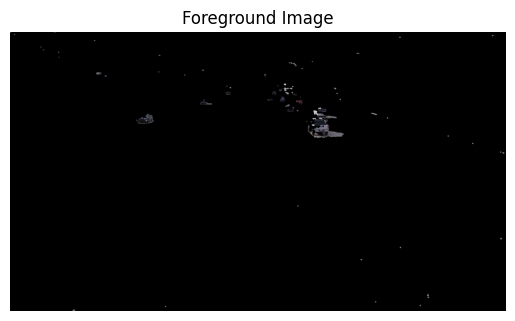

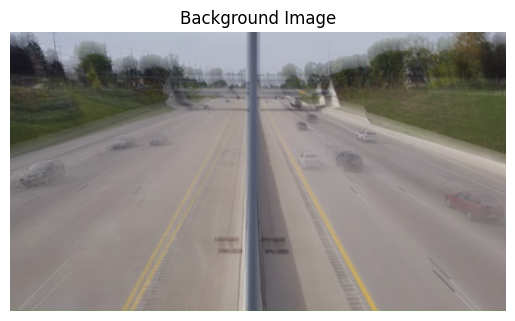

Processed frame 80
Processed frame 81
Processed frame 82
Processed frame 83
Processed frame 84
Processed frame 85
Processed frame 86
Processed frame 87
Processed frame 88
Processed frame 89


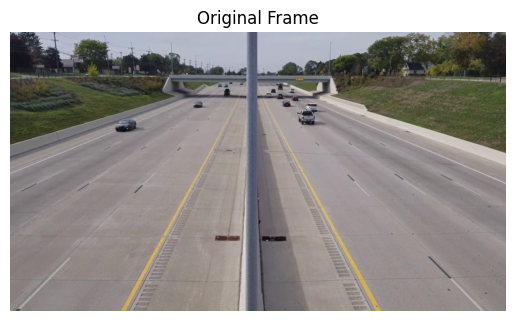

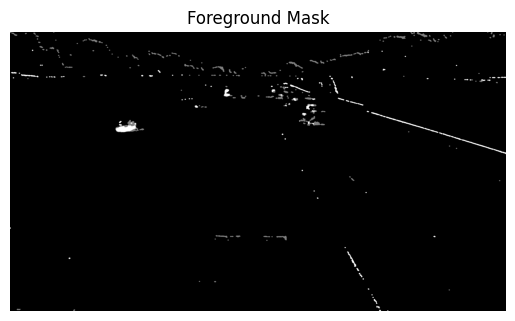

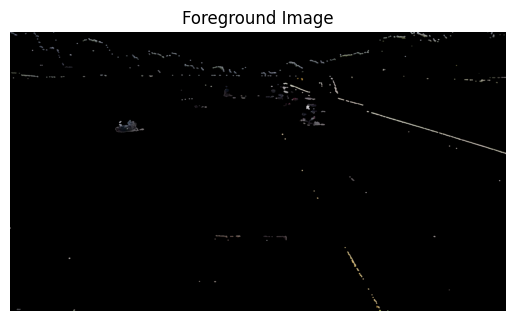

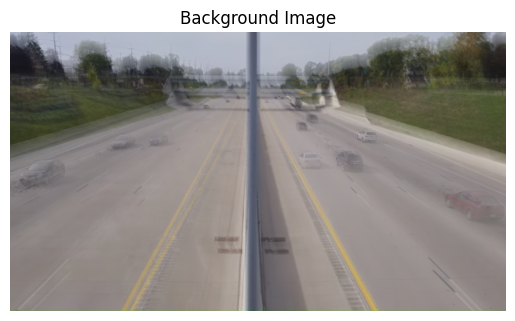

Processed frame 90
Processed frame 91
Processed frame 92
Processed frame 93
Processed frame 94
Processed frame 95
Processed frame 96
Processed frame 97
Processed frame 98
Processed frame 99


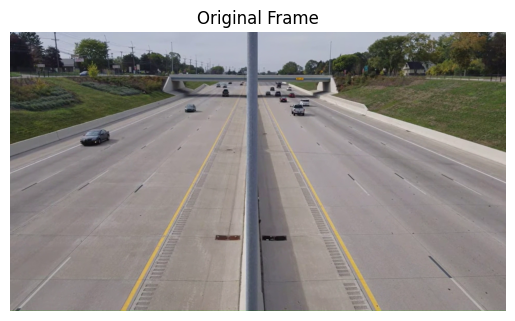

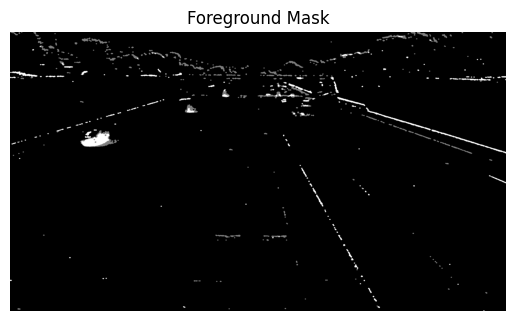

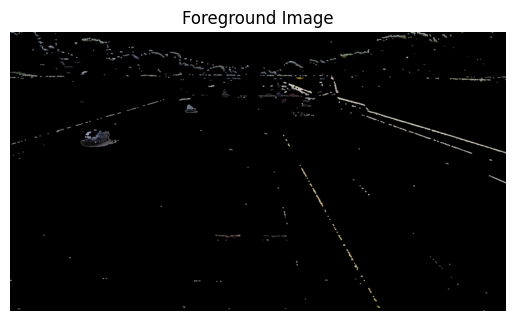

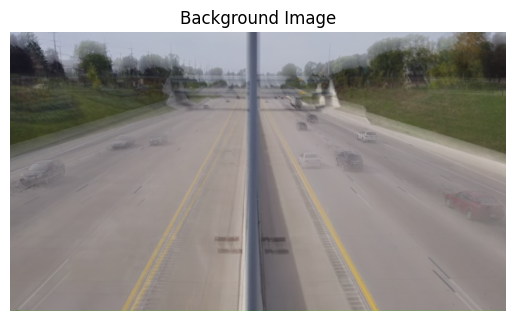

Processed frame 100
Processed frame 101
Processed frame 102
Processed frame 103
Processed frame 104
Processed frame 105
Processed frame 106
Processed frame 107
Processed frame 108
Processed frame 109


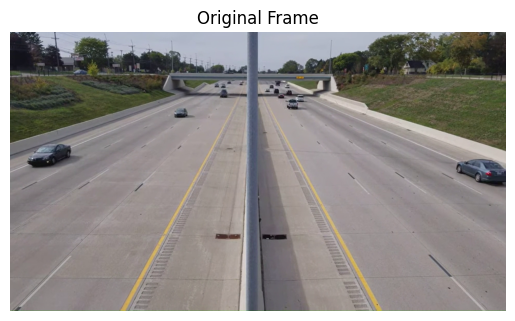

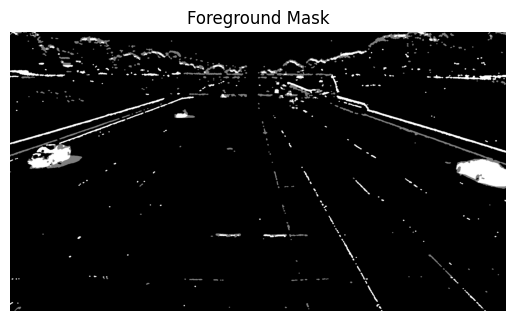

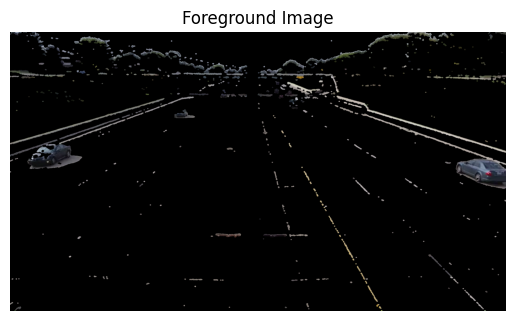

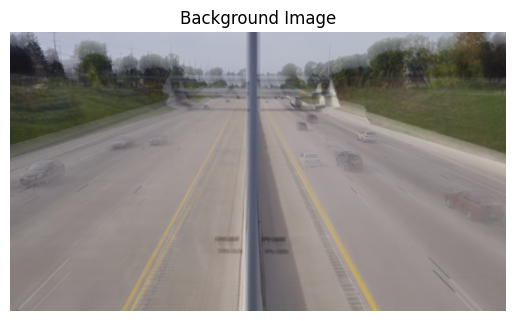

Processed frame 110
Processed frame 111
Processed frame 112
Processed frame 113
Processed frame 114
Processed frame 115
Processed frame 116
Processed frame 117
Processed frame 118
Processed frame 119


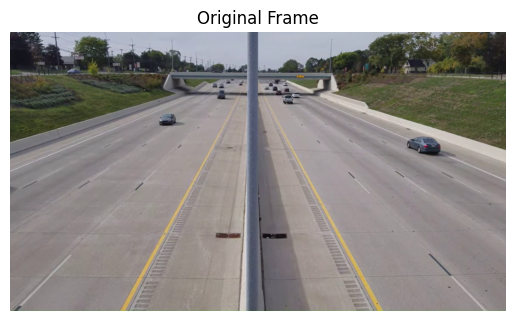

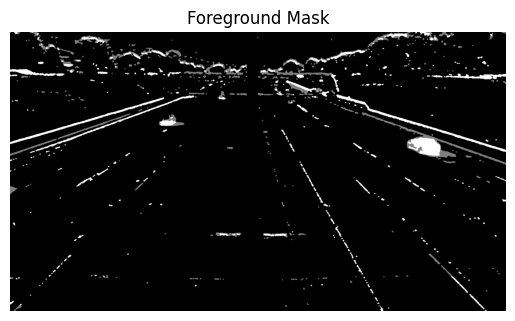

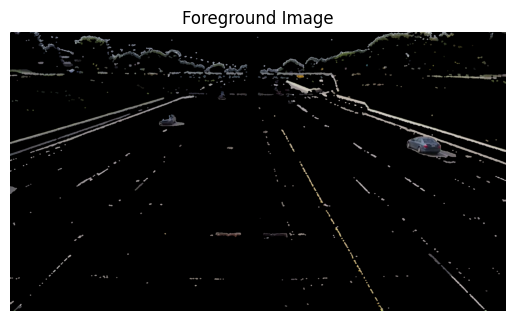

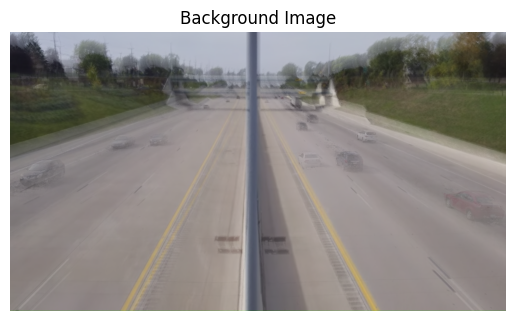

Processed frame 120
Processed frame 121
Processed frame 122
Processed frame 123
Processed frame 124
Processed frame 125
Processed frame 126
Processed frame 127
Processed frame 128
Processed frame 129


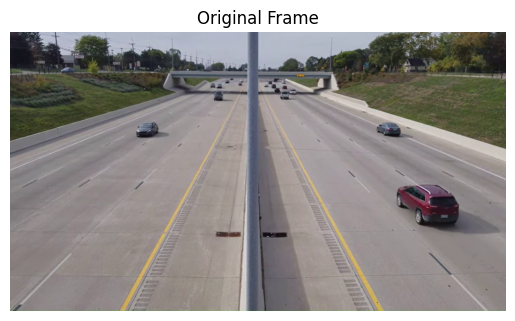

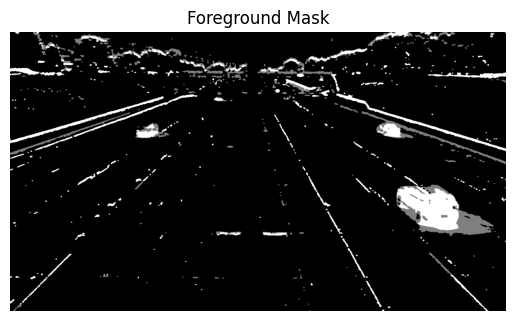

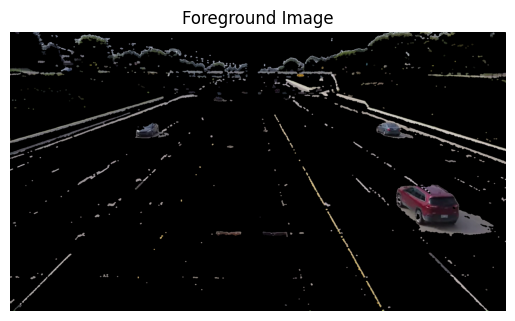

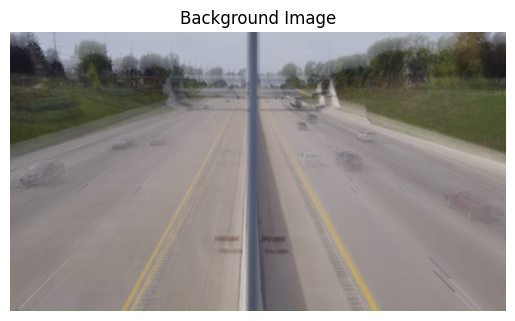

Processed frame 130
Processed frame 131
Processed frame 132
Processed frame 133
Processed frame 134
Processed frame 135
Processed frame 136
Processed frame 137
Processed frame 138
Processed frame 139


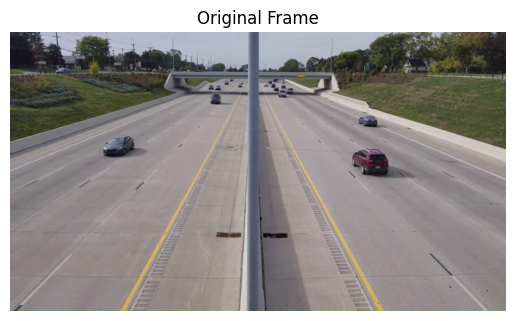

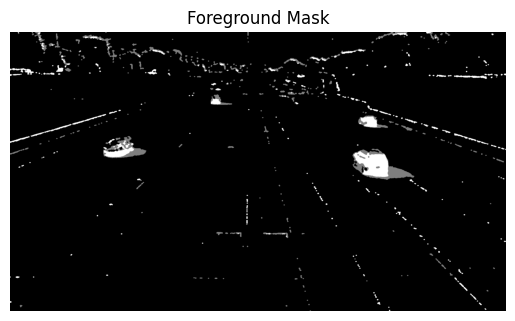

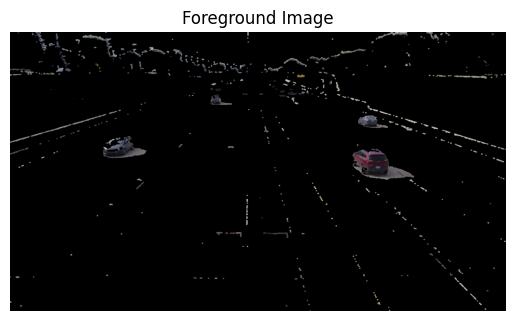

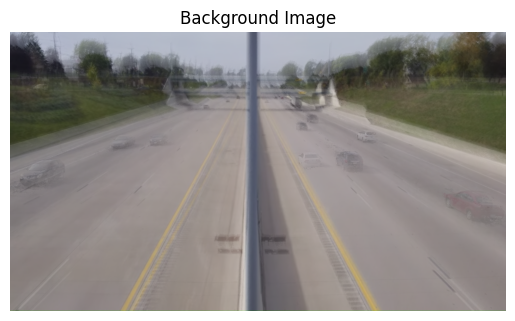

Processed frame 140
Processed frame 141
Processed frame 142
Processed frame 143
Processed frame 144
Processed frame 145
Processed frame 146
Processed frame 147
Processed frame 148
Processed frame 149


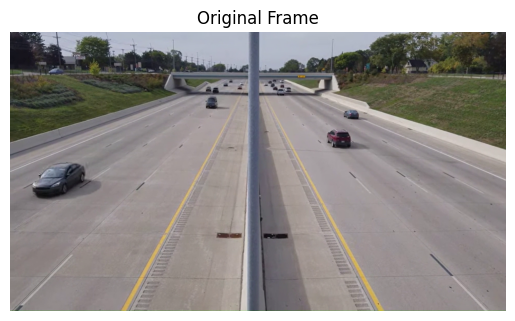

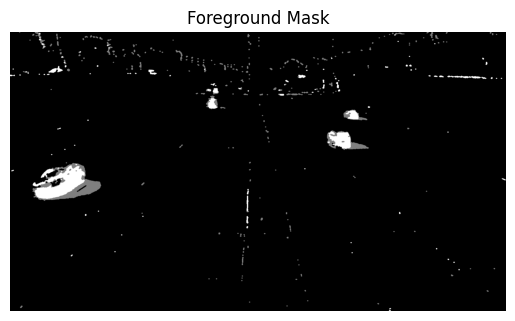

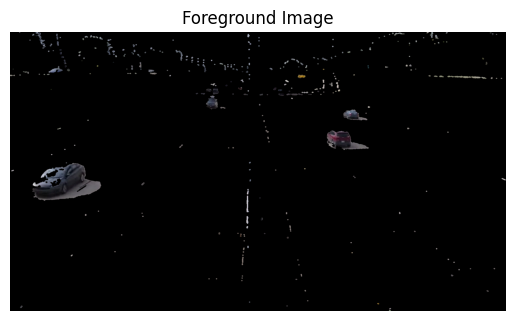

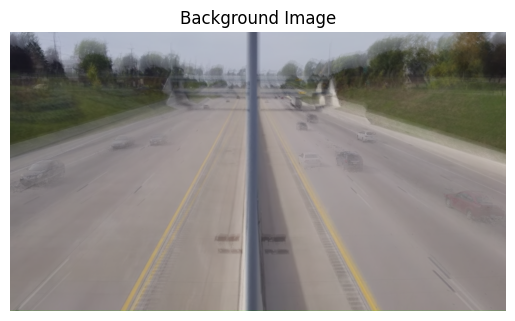

Processed frame 150
Processed frame 151
Processed frame 152
Processed frame 153
Processed frame 154
Processed frame 155
Processed frame 156
Processed frame 157
Processed frame 158
Processed frame 159


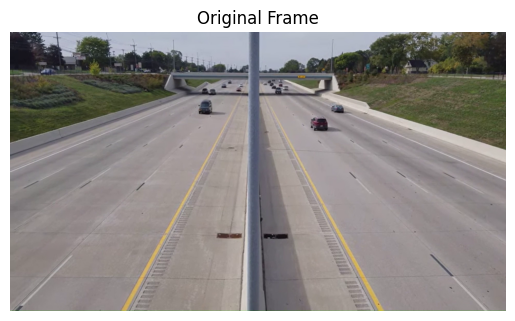

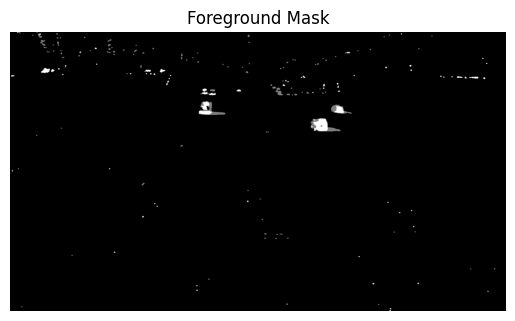

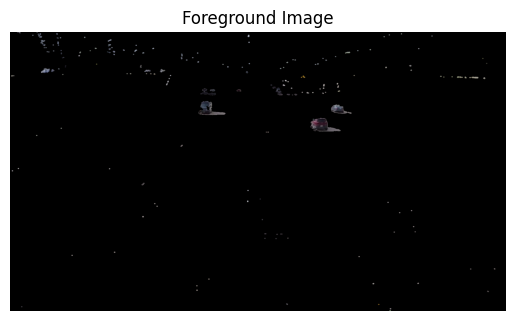

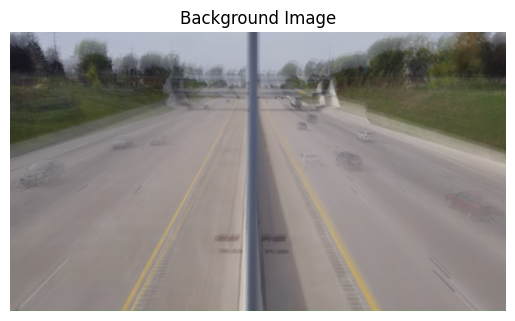

Processed frame 160
Processed frame 161
Processed frame 162
Processed frame 163
Processed frame 164
Processed frame 165
Processed frame 166
Processed frame 167
Processed frame 168
Processed frame 169


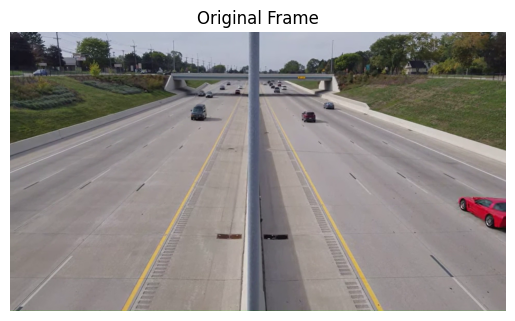

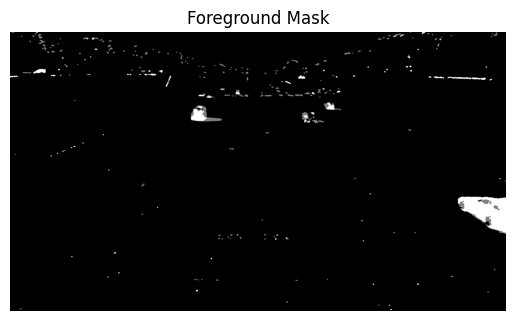

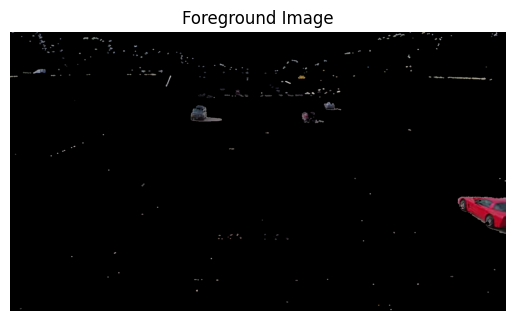

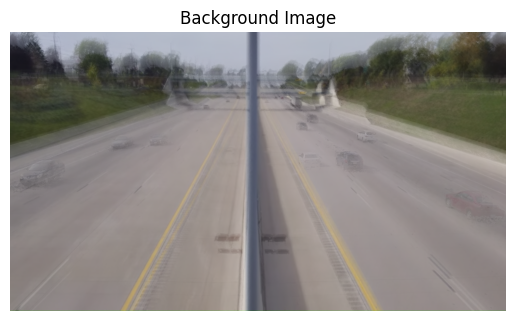

Processed frame 170
Processed frame 171
Processed frame 172
Processed frame 173
Processed frame 174
Processed frame 175
Processed frame 176
Processed frame 177
Processed frame 178
Processed frame 179


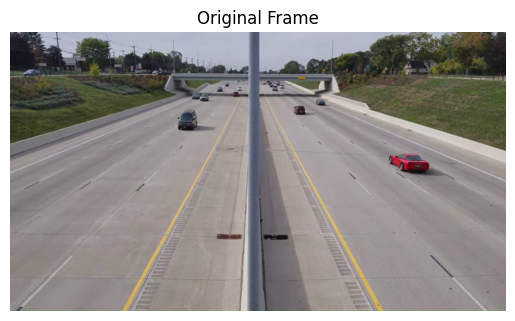

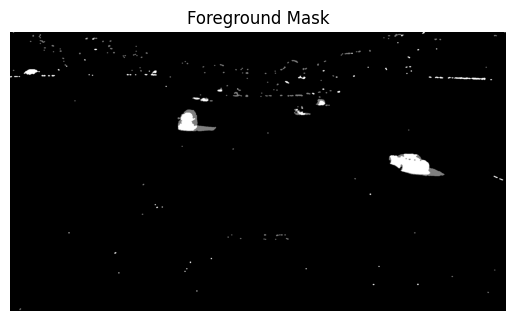

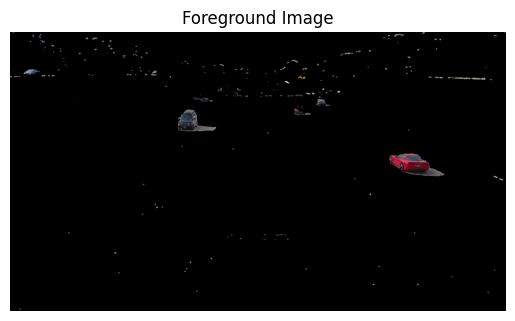

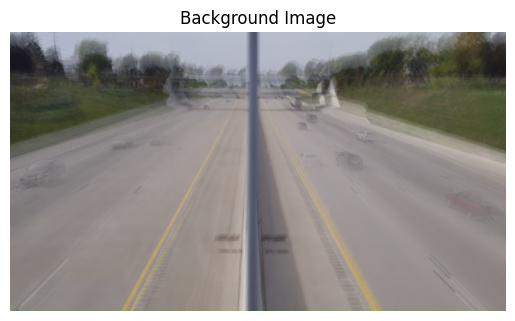

Processed frame 180
Processed frame 181
Processed frame 182
Processed frame 183
Processed frame 184
Processed frame 185
Processed frame 186
Processed frame 187
Processed frame 188
Processed frame 189


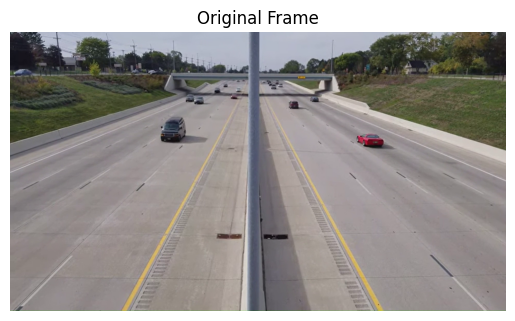

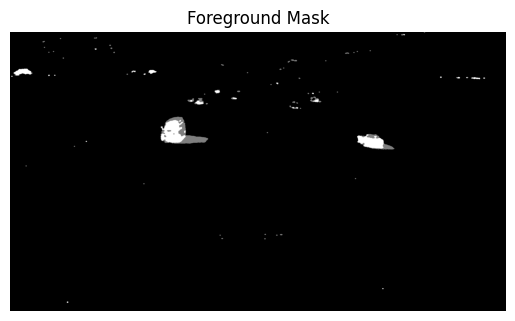

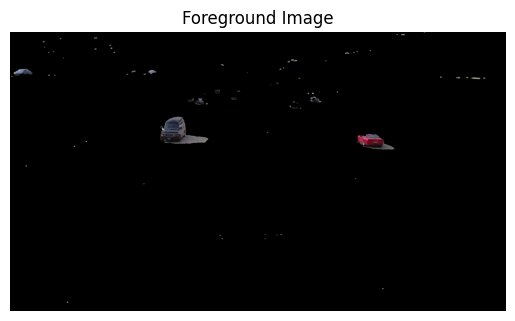

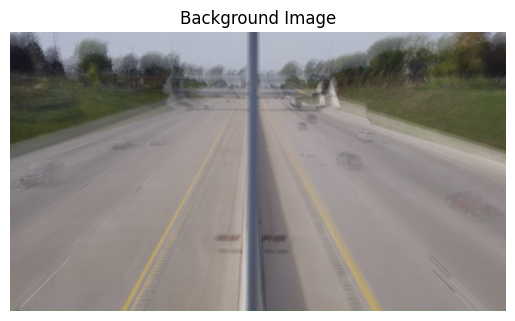

Processed frame 190
Processed frame 191
Processed frame 192
Processed frame 193
Processed frame 194
Processed frame 195
Processed frame 196
Processed frame 197
Processed frame 198
Processed frame 199


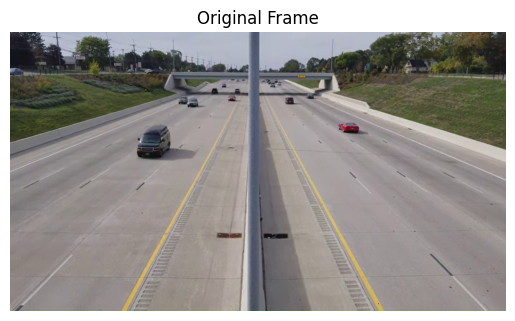

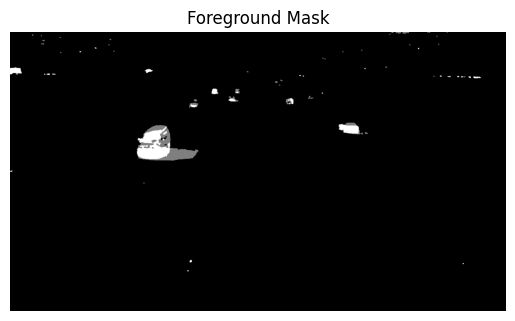

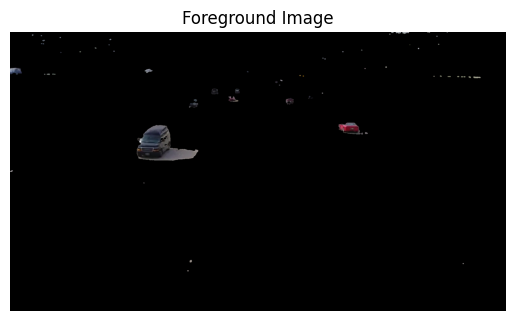

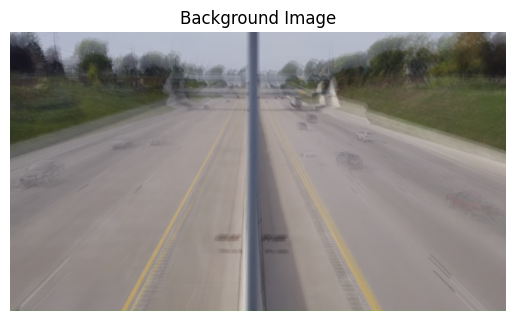

Processed frame 200
Processed frame 201
Processed frame 202
Processed frame 203
Processed frame 204
Processed frame 205
Processed frame 206
Processed frame 207
Processed frame 208
Processed frame 209


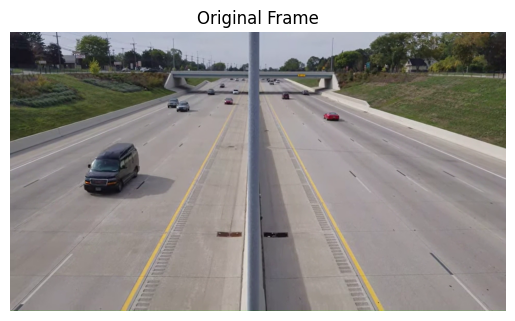

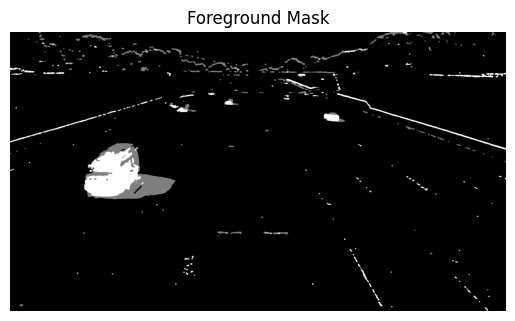

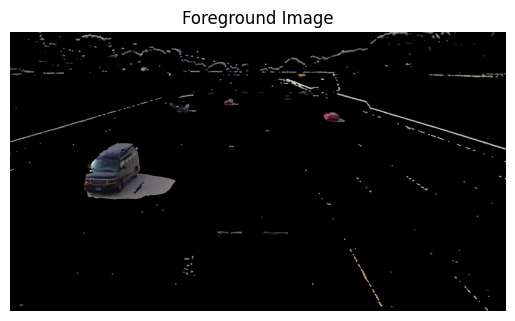

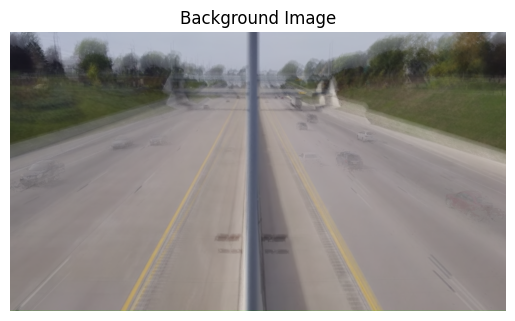

Processed frame 210
Processed frame 211
Processed frame 212
Processed frame 213
Processed frame 214
Processed frame 215
Processed frame 216
Processed frame 217
Processed frame 218
Processed frame 219


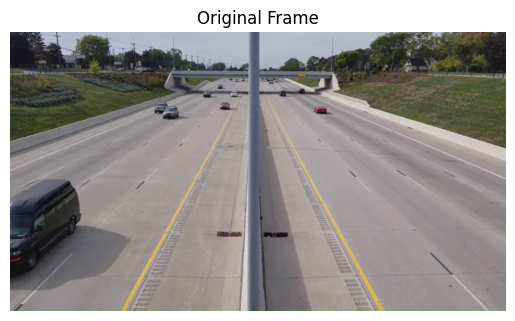

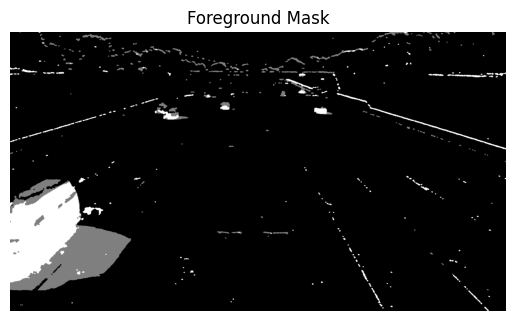

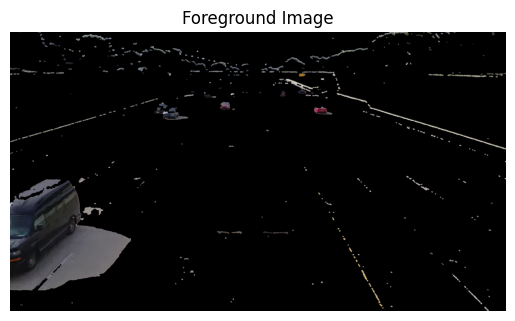

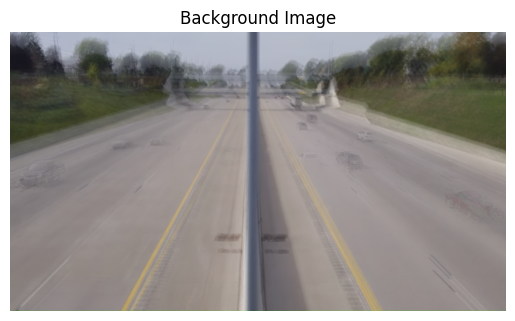

Processed frame 220
Processed frame 221
Processed frame 222
Processed frame 223
Processed frame 224
Processed frame 225
Processed frame 226
Processed frame 227
Processed frame 228
Processed frame 229


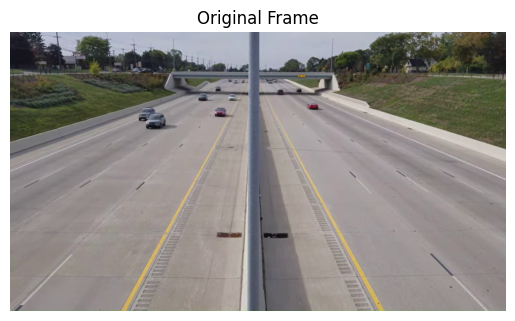

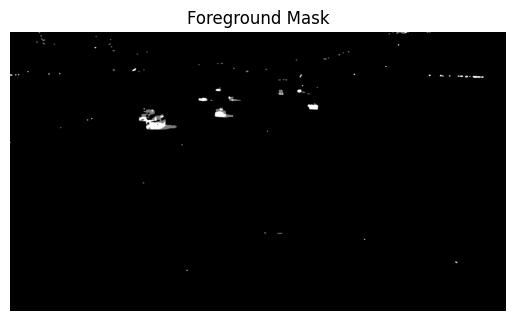

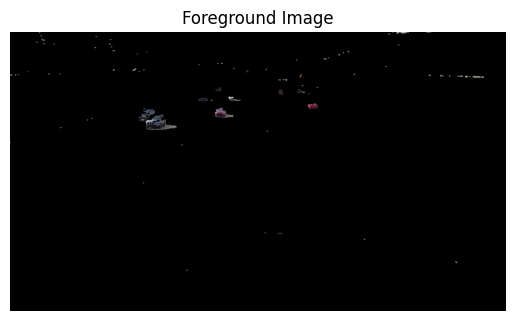

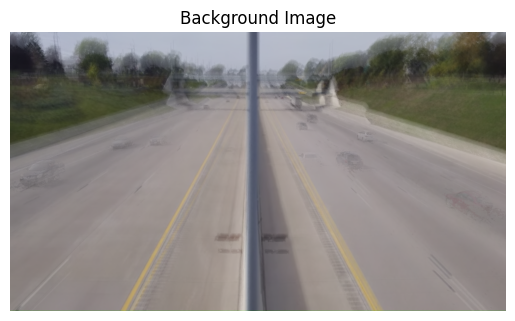

Processed frame 230
Processed frame 231


In [35]:
#########   GMM based backgroung Subtractor (10 frames)

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Initialize the video capture object
video_capture = cv2.VideoCapture('/content/cars2 - Made with Clipchamp.mp4')

# Initialize the GMM-based background subtractor
gmm_subtractor = cv2.createBackgroundSubtractorMOG2()

# Function to display a frame using matplotlib
def display_frame(frame, title="Frame"):
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Lists to store foreground segmented objects and background frames
foregrounds = []
backgrounds = []

i = 0
while True:
    ret, frame = video_capture.read()
    if not ret:
        break

    # Apply the GMM-based background subtractor to get the foreground mask
    fg_mask = gmm_subtractor.apply(frame)

    # Apply morphological operations to remove noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)) # Elliptical shapes are particularly good at handling diagonal structures
                                                                  # and corners compared to rectangular ones.
                                                                  # A larger size can remove larger noise elements
                                                                  # but may also cause more distortion to the original objects in the image.

    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel) # Erosion removes small objects or noise from the foreground mask.
                                                                # and dilation restores the size of the remaining objects.

    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_CLOSE, kernel) # Dilation fills small holes or gaps in the foreground objects
                                                                 # and erosion restores the original size of the objects.

    # Extract the foreground image, Bitwise-AND mask and original frame to get the foreground image.
    # combines the original frame with the foreground mask to extract the foreground image.
    fg_image = cv2.bitwise_and(frame, frame, mask=fg_mask)

    # Extract the background image
    bg_image = gmm_subtractor.getBackgroundImage()

    # Append the foreground and background to their respective lists
    foregrounds.append(fg_image)
    backgrounds.append(bg_image)

    # Display the results
    if i % 10 == 0:  # Display every 10 frames
        display_frame(frame, title="Original Frame")
        display_frame(fg_mask, title="Foreground Mask")
        display_frame(fg_image, title="Foreground Image")
        display_frame(bg_image, title="Background Image")

    print(f"Processed frame {i}")
    i += 1

    # Break the loop with a key press (for example, pressing 'q')
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Release the video capture object
video_capture.release()
cv2.destroyAllWindows()


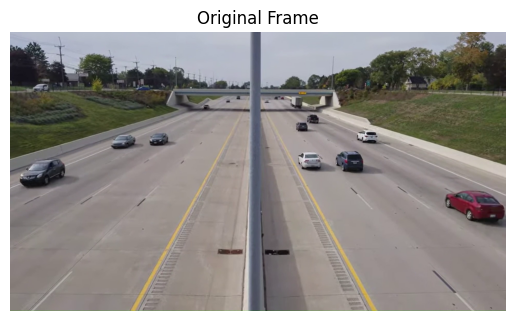

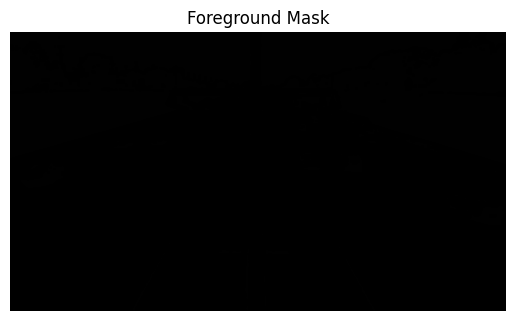

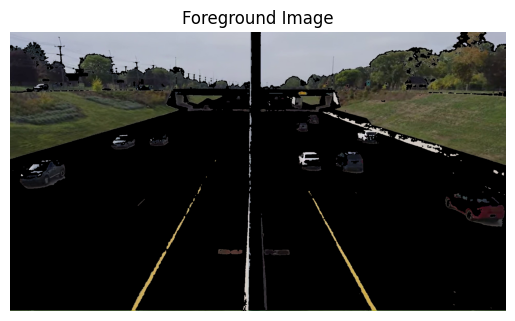


 Frame  0 



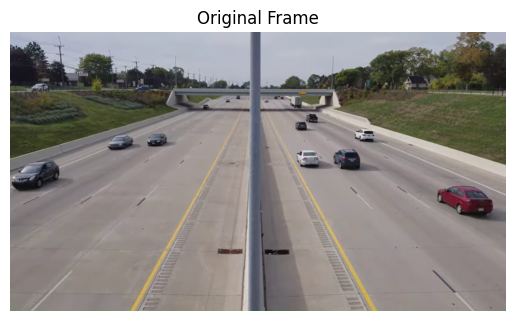

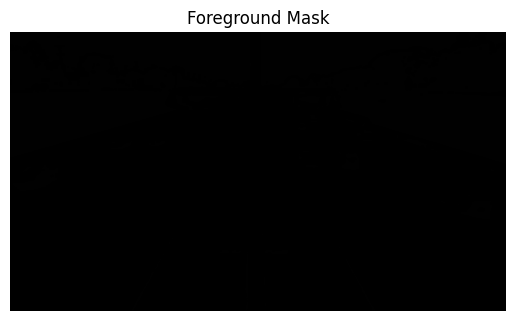

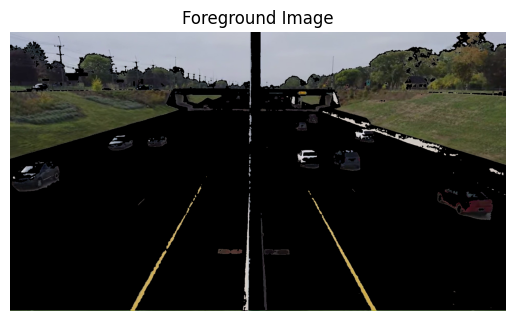


 Frame  1 



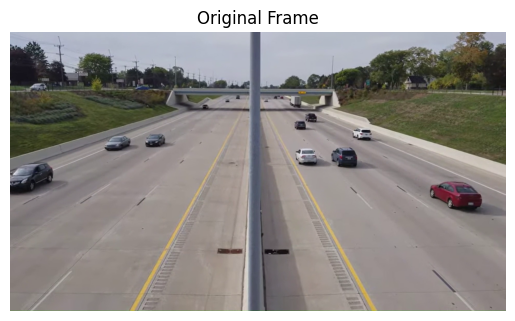

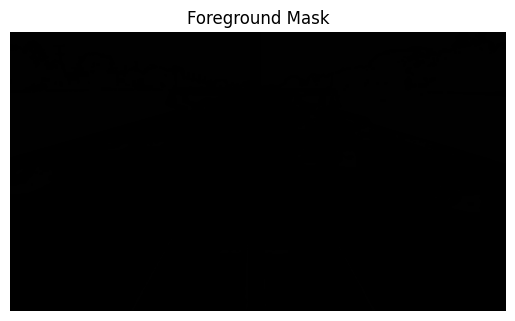

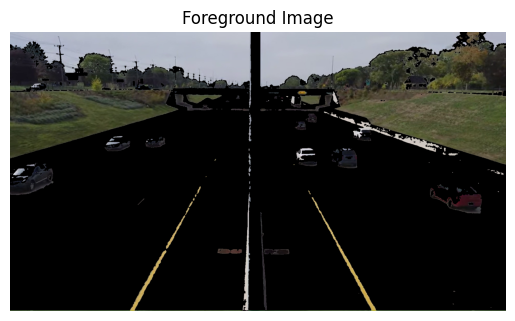


 Frame  2 



KeyboardInterrupt: 

In [5]:
########### GMM MODEL

import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

# Initialize the video capture object
video_capture = cv2.VideoCapture('/content/cars2 - Made with Clipchamp.mp4')

# Function to display the frame using matplotlib
def display_frame(frame, title="Frame"):
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Parameters for the Gaussian Mixture Model
n_components = 3  # Number of Gaussian components, the model will use three different Gaussian distributions to fit the data.
n_init = 1  # Number of initializations to perform
covariance_type = 'tied'  # Type of covariance parameters to use, the value 'tied' indicates that all components share the same covariance matrix.

# Function to apply Gaussian Mixture Model
def apply_gmm(frame, gmm):
    h, w, c = frame.shape
    reshaped_frame = frame.reshape(-1, 3)  #  This reshapes the frame from its original dimensions to a 2D array
                                           #  where each row represents a pixel and each column represents a color channel (i.e., RGB).
                                           #  This reshaping is necessary for the GMM to process the frame data.

    gmm.fit(reshaped_frame)  # Fit the GMM to the frame
    labels = gmm.predict(reshaped_frame)  # Predict the labels for each pixel

    #This determines the label of the background by finding the most common label among all the pixels.
    background_label = np.argmax(np.bincount(labels))

    fg_mask = (labels != background_label).astype(np.uint8).reshape(h, w)  # Create the foreground mask

    # Use morphological operations to remove noise from the foreground mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, kernel)
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_CLOSE, kernel)

    return fg_mask

gmm = GaussianMixture(n_components=n_components, n_init=n_init, covariance_type=covariance_type)

i = 0
while True:
    ret, frame = video_capture.read()
    if not ret:
        break

    # Apply the GMM to get the foreground mask
    fg_mask = apply_gmm(frame, gmm)

    # Bitwise-AND mask and original frame to get the foreground image
    fg_image = cv2.bitwise_and(frame, frame, mask=fg_mask)

    # Display the original frame
    display_frame(frame, title="Original Frame")

    # Display the foreground mask
    display_frame(fg_mask, title="Foreground Mask")

    # Display the foreground image
    display_frame(fg_image, title="Foreground Image")

    print("\n Frame ", i, "\n")
    i += 1

    # Break the loop with a key press (for example, pressing 'q')
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Release the video capture object
video_capture.release()
cv2.destroyAllWindows()


In [28]:
#########################################
####            VIDEO
#########################################

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Initialize the video capture object
video_capture = cv2.VideoCapture('/content/cars2 - Made with Clipchamp.mp4')

# Get the width, height, and frames per second (fps) of the input video
frame_width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video_capture.get(cv2.CAP_PROP_FPS))

# Initialize the background subtractor
back_sub = cv2.createBackgroundSubtractorMOG2()

# Initialize the video writer
output_filename = 'car2 result.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec
video_writer = cv2.VideoWriter(output_filename, fourcc, fps, (frame_width, frame_height))

# Function to display the frame using matplotlib (optional for debugging)
def display_frame(frame, title="Frame"):
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

while True:
    ret, frame = video_capture.read()
    if not ret:
        break

    # Apply the background subtractor to get the foreground mask
    fg_mask = back_sub.apply(frame)

    # Bitwise-AND mask and original frame to get the foreground image
    fg_image = cv2.bitwise_and(frame, frame, mask=fg_mask)


    # Write the foreground image to the video file
    video_writer.write(fg_image)

    # Break the loop with a key press (for example, pressing 'q')
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

# Release the video capture and writer objects
video_capture.release()
video_writer.release()
cv2.destroyAllWindows()